In [1]:
import cogsworth
import astropy.units as u
import astropy.constants as const
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import gala.dynamics as gd
import gala.potential as gp
from gala.units import galactic
from scipy.integrate import cumulative_trapezoid
from astropy.coordinates import SkyCoord
from scipy.ndimage import gaussian_filter
import seaborn as sns

import sys
sys.path.append('../src')
import plotting, helpers
from importlib import reload

%config InlineBackend.figure_format = 'retina'


pd.options.display.max_columns = 999

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': 0.7*fs,
          'legend.title_fontsize': 0.8*fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:193: GalaFutureWarning: In a future version of Gala, the current MilkyWayPotential and MilkyWayPotential2022 classes will be combined into a single class, MilkyWayPotential, with an optional 'version' argument to select between the models. To use the old (version 1) MilkyWayPotential, specify version="v1" when creating an instance. To use the newer (version 2 = current MilkyWayPotential2022), specify version="v2".
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(


In [2]:
pop = cogsworth.pop.load("/mnt/ceph/users/twagg/underworld/binaries", parts=[])
pop.bpp["row_num"] = np.arange(len(pop.bpp))
pop.colour = "tab:blue"
pop.label = "Fiducial"

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(


In [3]:
scale_up = 6e10 / pop.mass_binaries
scale_up

np.float64(3307.606976577281)

In [4]:
kinematics = helpers.get_kinematics([pop])
stars = cogsworth.sfh.SandersBinney2015(
    size=200000,
    **{
        "potential": pop.galactic_potential,
        "time_bins": 5,
        "verbose": True
    }
)

Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 161851 stars from the thin_disc
    Sampling 19349 stars with lookback times between 0.00 Gyr and 2.00 Gyr
    Sampling 24792 stars with lookback times between 2.00 Gyr and 4.00 Gyr
    Sampling 31236 stars with lookback times between 4.00 Gyr and 6.00 Gyr
    Sampling 39211 stars with lookback times between 6.00 Gyr and 8.00 Gyr
    Sampling 47263 stars with lookback times between 8.00 Gyr and 10.00 Gyr
  Sampling 38149 stars from the thick_disc
    Sampling 38149 stars with lookback times between 10.00 Gyr and 12.00 Gyr


# Double compact objects with a NS/BH

## At present day

In [5]:
ns_bin_nums = np.concatenate((
    pop.final_bpp["bin_num"][pop.final_bpp["kstar_1"] == 13],
    pop.final_bpp["bin_num"][pop.final_bpp["kstar_2"] == 13],
))
bh_bin_nums = np.concatenate((
    pop.final_bpp["bin_num"][pop.final_bpp["kstar_1"] == 14],
    pop.final_bpp["bin_num"][pop.final_bpp["kstar_2"] == 14],
))
bin_nums = np.concatenate((ns_bin_nums, bh_bin_nums))

ns_sep = np.concatenate((
    pop.final_bpp["sep"][pop.final_bpp["kstar_1"] == 13],
    pop.final_bpp["sep"][pop.final_bpp["kstar_2"] == 13],
))
bh_sep = np.concatenate((
    pop.final_bpp["sep"][pop.final_bpp["kstar_1"] == 14],
    pop.final_bpp["sep"][pop.final_bpp["kstar_2"] == 14],
))
separations = np.concatenate((ns_sep, bh_sep))

In [6]:
len(np.unique(bin_nums[separations > 0]))

1387

In [7]:
len(np.unique(bin_nums[((separations > 0) & (kinematics["Fiducial"]["escaped"]["CO"]))]))

0

In [8]:
reload(helpers)
underworld_binaries = helpers.get_underworld_binaries([pop], verbose=True)["Fiducial"]

Fiducial Underworld Binaries (scale up by 3308x):
  BH-BH:     1041  	3.4e+06 (scaled)	19.5 Msun 	0.0 Msun 	 7.7e+04 Rsun
  BH-NS:     37  	1.2e+05 (scaled)	13.3 Msun 	2.0 Msun 	 5.4e+02 Rsun
  BH-WD:     167  	5.5e+05 (scaled)	9.1 Msun 	0.0 Msun 	 3.9e+04 Rsun
  BH-Star:   2  	6.6e+03 (scaled)	3.2 Msun 	0.0 Msun 	 3.4e+00 Rsun

  NS-NS:     2  	6.6e+03 (scaled)	0.0 Msun 	1.7 Msun 	 4.1e+01 Rsun
  NS-WD:     121  	4.0e+05 (scaled)	0.0 Msun 	1.8 Msun 	 1.6e+04 Rsun
  NS-Star:   15  	5.0e+04 (scaled)	0.0 Msun 	2.1 Msun 	 3.7e+01 Rsun



In [9]:
# convert the above print statements to a LaTeX table
print(r"\begin{tabular}{l c c c c}")
print(r"  \hline")
print(r"  Population & $N_{\rm sim}$ & $N_{\rm MW}$ & $\langle m_{\rm CO} \rangle$ (M$_\odot$) & $\langle a \rangle$ (R$_\odot$) \\")
print(r"  \hline")
for label, table in underworld_binaries.items():
    n_binaries = len(table)
    avg_bh_mass = np.mean(np.concatenate((
        table["mass_1"][table["kstar_1"] == 14],
        table["mass_2"][table["kstar_2"] == 14],
    ))) if (table["kstar_1"] == 14).any() or (table["kstar_2"] == 14).any() else 0
    avg_ns_mass = np.mean(np.concatenate((
        table["mass_1"][table["kstar_1"] == 13],
        table["mass_2"][table["kstar_2"] == 13],
    ))) if (table["kstar_1"] == 13).any() or (table["kstar_2"] == 13).any() else 0

    avg_co_mass = f"{avg_bh_mass:.1f} / {avg_ns_mass:.1f}" if (avg_bh_mass > 0 and avg_ns_mass > 0) else (
        f"{avg_bh_mass:.1f}" if avg_bh_mass > 0 else (f"{avg_ns_mass:.1f}" if avg_ns_mass > 0 else "-")
    )

    avg_sep = np.mean(table["sep"])

    row = f"  {label} & ${len(table):.0f}$ & ${len(table) * scale_up:.1e}}}$ & ${avg_co_mass}$ & ${avg_sep:.1e}}}$ \\\\"
    row = row.replace('e+0', r'\times 10^{')
    row = row.replace('0.0', '-')
    print(row)

    # replace e+0x with "\times 10^{x}"


    if label == "BH-Star":
        print(r"  \hline")
print(r"\end{tabular}")

\begin{tabular}{l c c c c}
  \hline
  Population & $N_{\rm sim}$ & $N_{\rm MW}$ & $\langle m_{\rm CO} \rangle$ (M$_\odot$) & $\langle a \rangle$ (R$_\odot$) \\
  \hline
  BH-BH & $1041$ & $3.4\times 10^{6}$ & $19.5$ & $7.7\times 10^{4}$ \\
  BH-NS & $37$ & $1.2\times 10^{5}$ & $13.3 / 2.0$ & $5.4\times 10^{2}$ \\
  BH-WD & $167$ & $5.5\times 10^{5}$ & $9.1$ & $3.9\times 10^{4}$ \\
  BH-Star & $2$ & $6.6\times 10^{3}$ & $3.2$ & $3.4\times 10^{0}$ \\
  \hline
  NS-NS & $2$ & $6.6\times 10^{3}$ & $1.7$ & $4.1\times 10^{1}$ \\
  NS-WD & $121$ & $4.0\times 10^{5}$ & $1.8$ & $1.6\times 10^{4}$ \\
  NS-Star & $15$ & $5.0\times 10^{4}$ & $2.1$ & $3.7\times 10^{1}$ \\
\end{tabular}


In [10]:
underworld_binary_pos = pop.final_pos[:len(pop)][np.isin(pop.bin_nums, pd.concat(underworld_binaries.values())["bin_num"])]
underworld_binary_vel = pop.final_pos[:len(pop)][np.isin(pop.bin_nums, pd.concat(underworld_binaries.values())["bin_num"])]

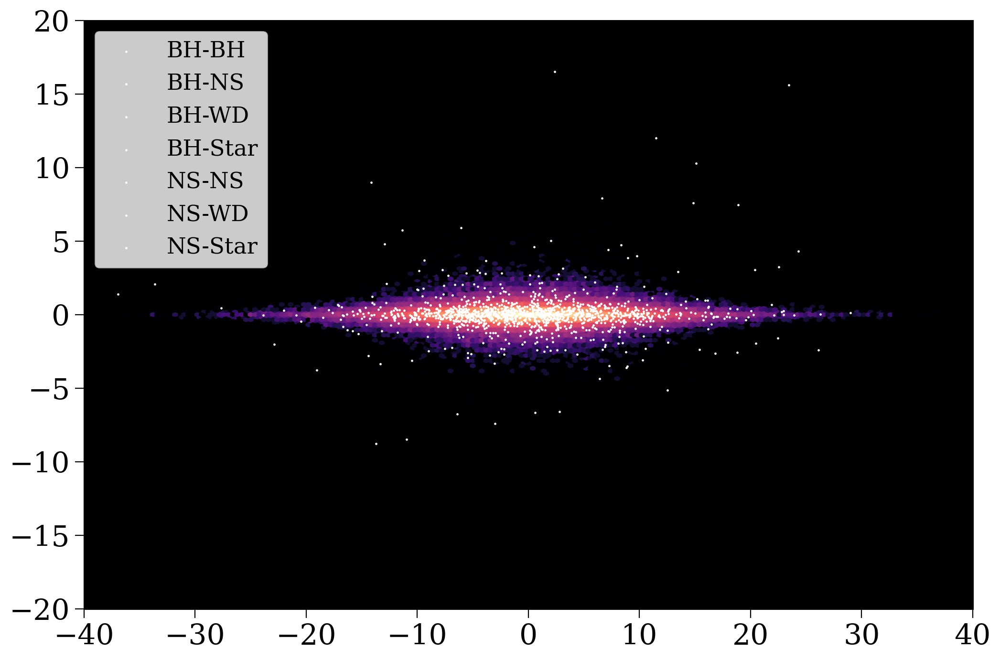

In [11]:
fig, ax = plt.subplots()
plt.hexbin(stars.x, stars.z, gridsize=200, extent=[-40, 40, -20, 20], cmap='magma', bins='log', mincnt=1)
cursor = 0
for label, table in underworld_binaries.items():
    plt.scatter(underworld_binary_pos[cursor:cursor+len(table), 0], underworld_binary_pos[cursor:cursor+len(table), 2], s=.5, label=label, c='white')
    cursor += len(table)
plt.xlim(-40, 40)
plt.ylim(-20, 20)
plt.legend()
ax.set_fc('black')
plt.show()

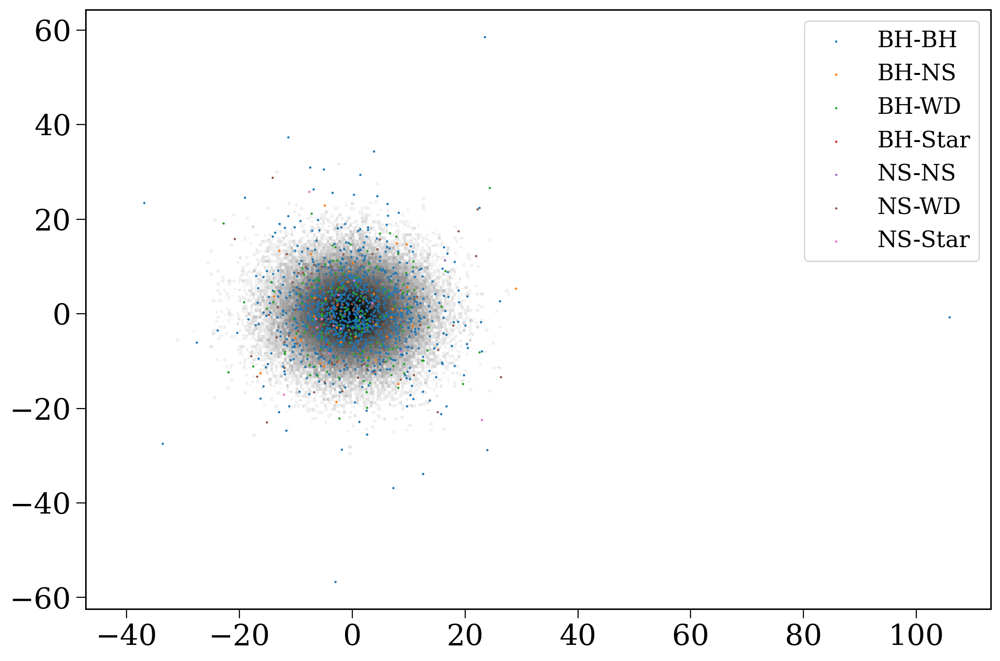

In [12]:

plt.hexbin(stars.x, stars.y, gridsize=200, extent=[-40, 40, -40, 40], cmap='Greys', bins='log', mincnt=1)
cursor = 0
for label, table in underworld_binaries.items():
    plt.scatter(underworld_binary_pos[cursor:cursor+len(table), 0], underworld_binary_pos[cursor:cursor+len(table), 1], s=.5, label=label)
    cursor += len(table)
# plt.xlim(-40, 40)
# plt.ylim(-20, 20)
plt.legend()
plt.show()

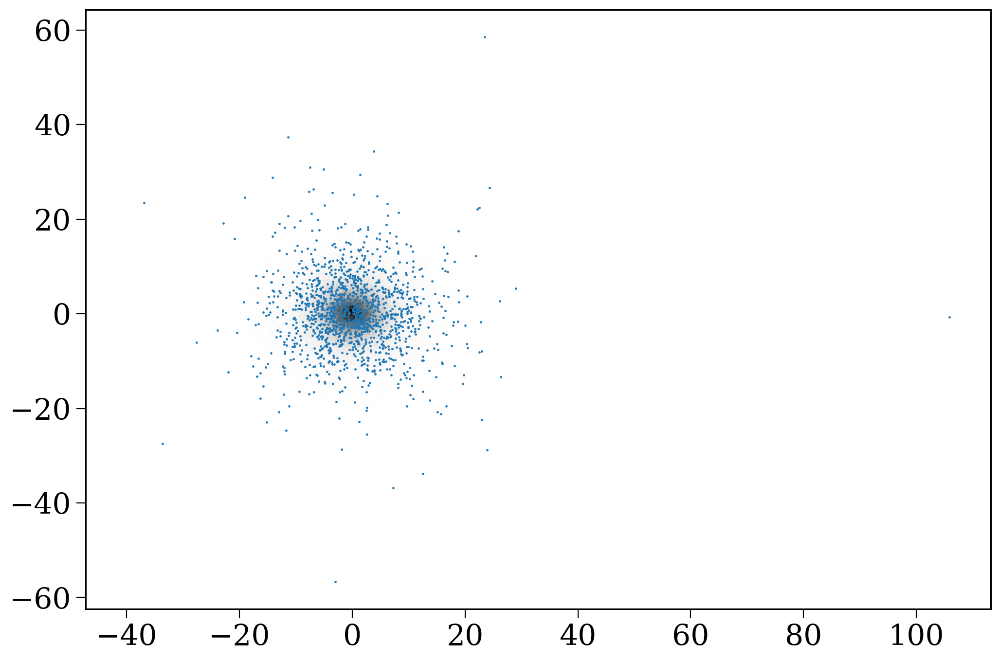

In [13]:
plt.hexbin(stars.x, stars.y, gridsize=200, extent=[-40, 40, -40, 40], cmap='Greys')
plt.scatter(underworld_binary_pos[:, 0], underworld_binary_pos[:, 1], s=0.5)

In [14]:
pop._file = "/mnt/ceph/users/twagg/underworld/binaries"
pop.initial_galaxy
pop._file = None

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(



In [15]:
ub_pop = pop[np.isin(pop.bin_nums, pd.concat(underworld_binaries.values())["bin_num"])]

In [16]:
ub_pop.store_entire_orbits = True
ub_pop.perform_galactic_evolution()

  0%|          | 0/1385 [00:00<?, ?it/s]

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2

 19%|█▉        | 264/1385 [00:00<00:00, 2335.62it/s]

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential

100%|██████████| 1385/1385 [00:02<00:00, 593.48it/s]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


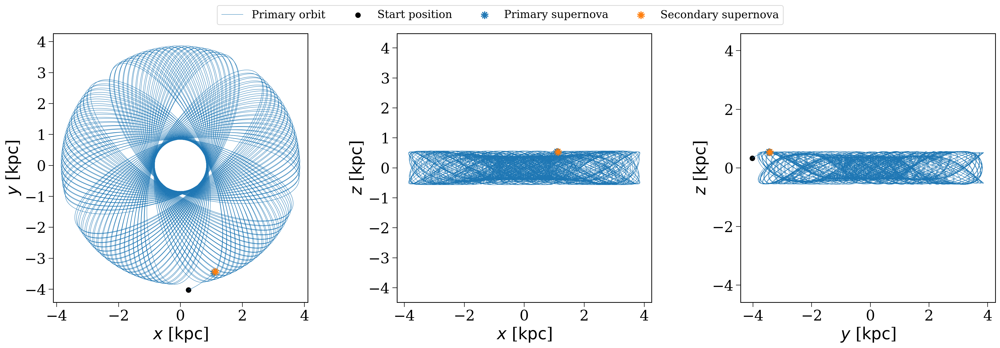

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


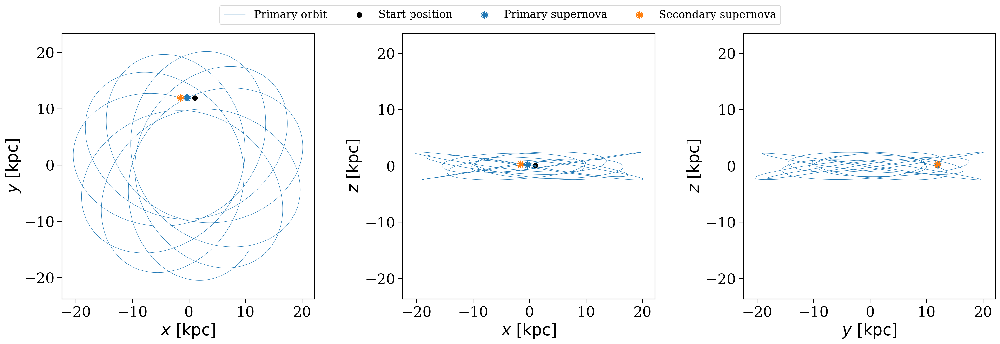

(<Figure size 2500x700 with 3 Axes>,
 [<Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$y$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$y$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>])

In [17]:
ub_pop.plot_orbit(4142, t_max=50000 * u.Myr, primary_kwargs={"linewidth": .5})
ub_pop.plot_orbit(2251, t_max=50000 * u.Myr, primary_kwargs={"linewidth": .5})

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


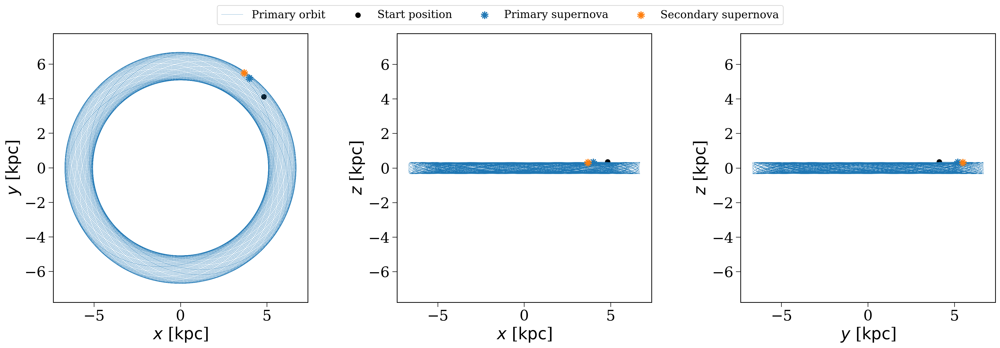

(<Figure size 2500x700 with 3 Axes>,
 [<Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$y$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$y$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>])

In [18]:
ub_pop.plot_orbit(1894, t_max=50000 * u.Myr, primary_kwargs={"linewidth": .25})

## Luminous companions

In [19]:
co_lc = pop.bpp[(pop.bpp["kstar_1"].isin([13, 14]) & (pop.bpp["kstar_2"] < 10) & (pop.bpp["sep"] > 0)) | (pop.bpp["kstar_2"].isin([13, 14]) & (pop.bpp["kstar_1"] < 10) & (pop.bpp["sep"] > 0))]

In [20]:
bh_lc = pop.bpp[(pop.bpp["kstar_1"].isin([14]) & (pop.bpp["kstar_2"] < 10) & (pop.bpp["sep"] > 0)) | (pop.bpp["kstar_2"].isin([14]) & (pop.bpp["kstar_1"] < 10) & (pop.bpp["sep"] > 0))]

In [21]:
ns_lc = pop.bpp[(pop.bpp["kstar_1"].isin([13]) & (pop.bpp["kstar_2"] < 10) & (pop.bpp["sep"] > 0)) | (pop.bpp["kstar_2"].isin([13]) & (pop.bpp["kstar_1"] < 10) & (pop.bpp["sep"] > 0))]

In [22]:
co_lc["bin_num"].unique()

array([     9,     89,    267, ..., 317052, 317196, 317200], shape=(5783,))

In [23]:
bh_lc["bin_num"].unique()

array([    89,    493,    607, ..., 317013, 317052, 317196], shape=(3568,))

In [24]:
ns_lc["bin_num"].unique()

array([     9,    267,    452, ..., 316773, 316873, 317200], shape=(2250,))

In [25]:
pop.mass_binaries / 1e7

np.float64(1.814000285550496)

## Mergers

In [26]:
bhbh_mergers = pop.bpp[(pop.bpp["evol_type"] == 3) & (
    (pop.bpp["kstar_1"] == 14) & (pop.bpp["kstar_2"] == 14)
)]
nsns_mergers = pop.bpp[(pop.bpp["evol_type"] == 3) & (
    (pop.bpp["kstar_1"] == 13) & (pop.bpp["kstar_2"] == 13)
)]
nsbh_mergers = pop.bpp[(pop.bpp["evol_type"] == 3) & (
    ((pop.bpp["kstar_1"] == 13) & (pop.bpp["kstar_2"] == 14)) |
    ((pop.bpp["kstar_1"] == 14) & (pop.bpp["kstar_2"] == 13))
)]
gw_mergers = pd.concat([bhbh_mergers, nsns_mergers, nsbh_mergers])
print(f"Estimated number of mergers in a MW-mass galaxy (minimum here would be {scale_up:.0f}):")
print(f"  BH-BH mergers: {len(bhbh_mergers) * scale_up:.0f}")
print(f"  NS-NS mergers: {len(nsns_mergers) * scale_up:.0f}")
print(f"  NS-BH mergers: {len(nsbh_mergers) * scale_up:.0f}")

Estimated number of mergers in a MW-mass galaxy (minimum here would be 3308):
  BH-BH mergers: 205072
  NS-NS mergers: 6615
  NS-BH mergers: 82690


In [27]:
gw_merger_pop = pop[np.isin(pop.bin_nums, gw_mergers["bin_num"])]
gw_merger_pop.bpp_columns = [col.decode('utf-8') if isinstance(col, bytes) else col for col in gw_merger_pop.bpp_columns]
gw_merger_pop.store_entire_orbits = True
# gw_merger_pop.perform_stellar_evolution()
gw_merger_pop.perform_galactic_evolution()

  0%|          | 0/89 [00:00<?, ?it/s]

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential20

100%|██████████| 89/89 [00:00<00:00, 482.36it/s]


In [28]:
pop.bpp[(pop.bpp["evol_type"] == 1) & (pop.bpp["tphys"] != 0.0) & (pop.bpp["sep"] != 0.0)].drop_duplicates(subset=["bin_num"])

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,evol_type,RRLO_1,RRLO_2,massc_1,massc_2,lum_1,lum_2,teff_1,teff_2,SN_1,SN_2,bin_num,row_num
6,9.865615,2.091433,1.940155,13,13,-1.000000,-1.000000,-1.000000,1,0.000100,2.0,2.091433,1.940155,4.698742e-03,3.118031e+00,4.056963e+05,2.059092e+06,1,1,6,63
9,19.927331,1.531040,11.145105,13,1,154.785424,62.686447,0.736178,1,0.000002,2.0,1.531040,0.000000,2.660547e+00,1.935474e+04,1.979011e+06,2.626355e+04,1,0,9,88
11,37.134435,1.277584,1.277584,13,13,-1.000000,-1.000000,-1.000000,1,0.000100,2.0,1.277584,1.277584,1.709164e-03,2.356735e+00,3.150660e+05,1.919921e+06,1,1,11,106
13,10.563851,5.081076,2.293482,14,13,-1.000000,-1.000000,-1.000000,1,0.000100,2.0,5.081076,2.293482,1.000000e-10,3.487883e+00,3.950107e+03,2.117610e+06,1,1,13,119
37,20.681396,2.134053,1.339482,13,13,-1.000000,-1.000000,-1.000000,1,0.000100,2.0,2.134053,1.339482,1.984748e-04,2.432639e+00,1.839213e+05,1.935196e+06,1,1,37,281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317146,18.688517,3.193850,1.277584,14,13,-1.000000,-1.000000,-1.000000,1,0.000100,2.0,3.193850,1.277584,1.000000e-10,2.356735e+00,4.982295e+03,1.919921e+06,1,1,317146,2315276
317153,15.735238,2.839275,2.088042,13,13,-1.000000,-1.000000,-1.000000,1,0.000100,2.0,2.839275,2.088042,1.003682e-02,3.275332e+00,4.904611e+05,2.084584e+06,1,1,317153,2315331
317169,15.242920,2.967848,1.686463,13,13,-1.000000,-1.000000,-1.000000,1,0.000100,2.0,2.967848,1.686463,2.946758e-03,2.838602e+00,3.610287e+05,2.011323e+06,1,1,317169,2315477
317176,9.970183,8.668299,7.795944,14,14,-1.000000,-1.000000,-1.000000,1,0.000100,2.0,8.668299,7.795944,1.000000e-10,1.000000e-10,3.024264e+03,3.188984e+03,1,1,317176,2315528


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


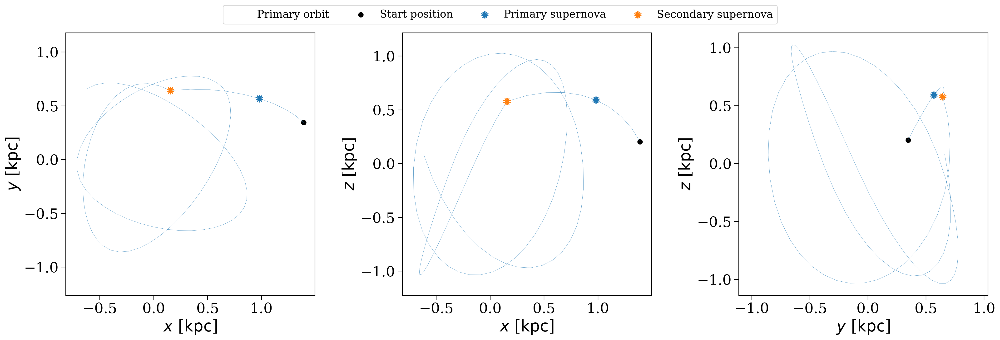

(<Figure size 2500x700 with 3 Axes>,
 [<Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$y$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$y$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>])

In [29]:
gw_merger_pop.plot_orbit(gw_merger_pop.bin_nums[80], t_max=100 * u.Myr, primary_kwargs={"linewidth": .25})

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


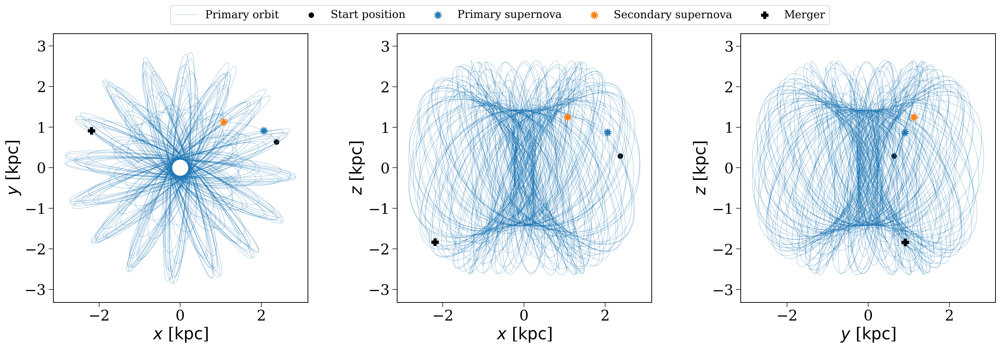

(<Figure size 2500x700 with 3 Axes>,
 [<Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$y$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$y$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>])

In [30]:
gw_merger_pop.plot_orbit(gw_merger_pop.bin_nums[0], t_max=10000 * u.Myr, primary_kwargs={"linewidth": .25})

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


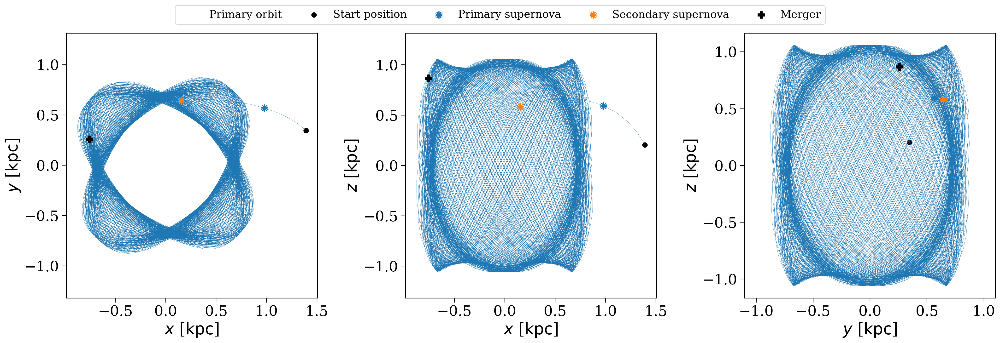

(<Figure size 2500x700 with 3 Axes>,
 [<Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$y$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$x$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>,
  <Axes: xlabel='$y$ [$\\mathrm{kpc}$]', ylabel='$z$ [$\\mathrm{kpc}$]'>])

In [31]:
gw_merger_pop.plot_orbit(gw_merger_pop.bin_nums[80], t_max=10000 * u.Myr, primary_kwargs={"linewidth": .25})

In [32]:
# find the location at which mergers occurs (the time in the orbit that corresponds to the merger time in the bpp table where sep == 0)
birth_lookback_times = gw_merger_pop.initial_galaxy.tau[np.isin(gw_merger_pop.bin_nums, gw_mergers["bin_num"])]
gw_merger_locs = np.zeros((len(gw_merger_pop.bin_nums), 3)) * u.kpc
gw_merger_times = np.zeros(len(gw_merger_pop.bin_nums)) * u.Myr
for i, bin_num in enumerate(gw_merger_pop.bin_nums):
    time_birth_to_merger = gw_merger_pop.bpp[(gw_merger_pop.bpp["bin_num"] == bin_num) & (gw_merger_pop.bpp["sep"] == 0.0)]["tphys"].values[0] * u.Myr
    merger_time = gw_merger_pop.max_ev_time - birth_lookback_times[i] + time_birth_to_merger
    orbit_times = gw_merger_pop.primary_orbits[i].t.to(u.Myr)
    closest_time_idx = np.argmin(np.abs(orbit_times - merger_time))
    merger_pos = gw_merger_pop.primary_orbits[i].pos[closest_time_idx].xyz
    gw_merger_times[i] = merger_time
    gw_merger_locs[i] = merger_pos
    # print(f"Bin {bin_num}: Merger time = {merger_time:.2f}, Position at merger = ({merger_pos[0]:.2f}, {merger_pos[1]:.2f}, {merger_pos[2]:.2f}) kpc")

In [33]:
gw_merger_types = np.repeat("BHBH", len(gw_merger_pop))
gw_merger_types[np.isin(gw_merger_pop.bin_nums, nsns_mergers["bin_num"])] = "NSNS"
gw_merger_types[np.isin(gw_merger_pop.bin_nums, nsbh_mergers["bin_num"])] = "BHNS"

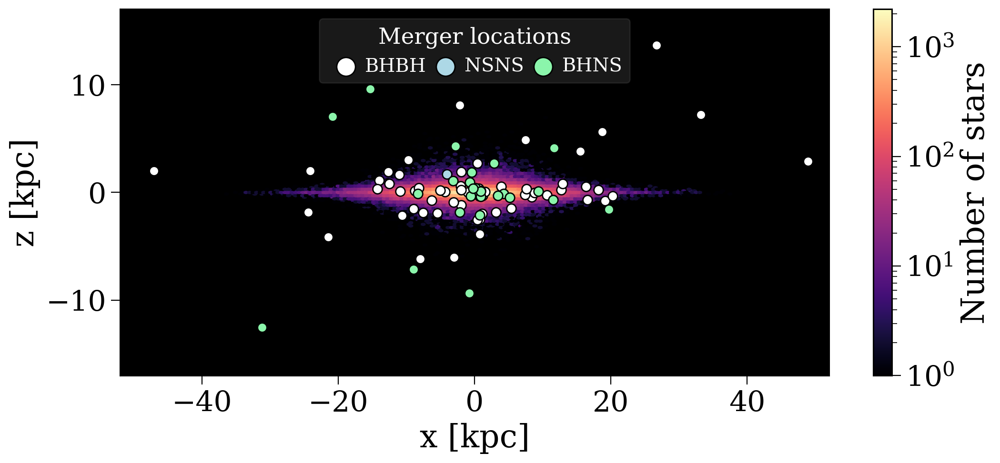

In [37]:
fig, ax = plt.subplots(figsize=(12, 5))
hexbin = plt.hexbin(stars.x, stars.z, gridsize=200, extent=[-52, 52, -17, 17], cmap='magma', bins='log', mincnt=1)

for dco_type, colour in zip(
    ["BHBH", "NSNS", "BHNS"],
    ["white", "lightblue", "#8BF5AB"],
):
    mask = gw_merger_types == dco_type
    ax.scatter(gw_merger_locs[mask, 0], gw_merger_locs[mask, 2], s=50, c=colour, label=dco_type, edgecolors='black')

fig.colorbar(hexbin, label="Number of stars")

ax.set(
    xlim=(-52, 52),
    ylim=(-17, 17),
    xlabel="x [kpc]",
    ylabel="z [kpc]",
)

leg = ax.legend(ncol=3, handletextpad=0.0, columnspacing=0.0, loc='upper center', fontsize=0.6*fs,
          markerscale=2, framealpha=0.1, labelcolor='white', title="Merger locations", title_fontsize=0.7*fs)
plt.setp(leg.get_title(), color='white')
ax.set_fc('black')
plt.show()

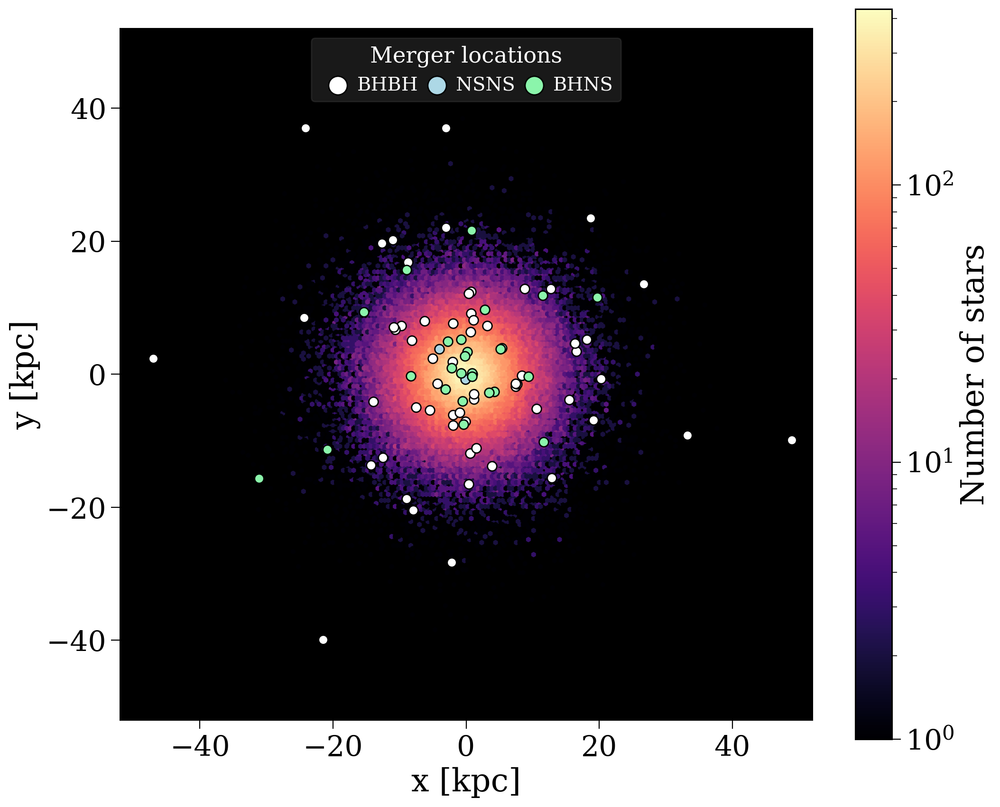

In [38]:
fig, ax = plt.subplots(figsize=(10 / 0.85, 10))
hexbin = plt.hexbin(stars.x, stars.y, gridsize=200, extent=[-52, 52, -52, 52], cmap='magma', bins='log', mincnt=1)

for dco_type, colour in zip(
    ["BHBH", "NSNS", "BHNS"],
    ["white", "lightblue", "#8BF5AB"],
):
    mask = gw_merger_types == dco_type
    ax.scatter(gw_merger_locs[mask, 0], gw_merger_locs[mask, 1], s=50, c=colour, label=dco_type, edgecolors='black')

fig.colorbar(hexbin, label="Number of stars")

ax.set(
    xlim=(-52, 52),
    ylim=(-52, 52),
    xlabel="x [kpc]",
    ylabel="y [kpc]",
)

leg = ax.legend(ncol=3, handletextpad=0.0, columnspacing=0.0, loc='upper center', fontsize=0.6*fs,
          markerscale=2, framealpha=0.1, labelcolor='white', title="Merger locations", title_fontsize=0.7*fs)
plt.setp(leg.get_title(), color='white')
ax.set_fc('black')
ax.set_aspect('equal')
plt.show()